In [2]:
import pandas as pd
import librosa
import torchaudio
import torch


from tqdm import tqdm
tqdm.pandas()

In [3]:
DATA_PATH = "../data/birdclef2025"

In [4]:
train_df = pd.read_csv(DATA_PATH + "/train.csv")

In [5]:
train_df.head()

,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
0,1139490,[''],[''],1139490/CSA36385.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3206,-73.7128,Ragoniella pulchella,Ragoniella pulchella,Fabio A. Sarria-S,cc-by-nc-sa 4.0
1,1139490,[''],[''],1139490/CSA36389.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3206,-73.7128,Ragoniella pulchella,Ragoniella pulchella,Fabio A. Sarria-S,cc-by-nc-sa 4.0
2,1192948,[''],[''],1192948/CSA36358.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3791,-73.7313,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
3,1192948,[''],[''],1192948/CSA36366.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.2800,-73.8582,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
4,1192948,[''],[''],1192948/CSA36373.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3791,-73.7313,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0


In [6]:
train_df['filepath'] = train_df['filename'].apply(lambda x: f"{DATA_PATH}/train_audio/{x}")

In [7]:
from src.datasets.audio_dataset import AudioDataset

dataset = AudioDataset(
    input_df=train_df,
    filenpath_col='filepath',
    target_col='primary_label',
    mixup_audio=False,
    mixup_params={
        'prob': 1,
        'alpha': 0.5,
        'hard_target': False
    }
)

In [8]:
def get_label(target):
    return dataset.target_encoder.inverse_transform(target.reshape(1, -1))[0][0]

In [9]:
dataset.target_encoder.categories_[0].shape[0]

206

In [22]:
sample = dataset[1]

sample

(tensor([ 0.1016,  0.0932,  0.1048,  ..., -0.0662, -0.0945, -0.1184]),
 tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0

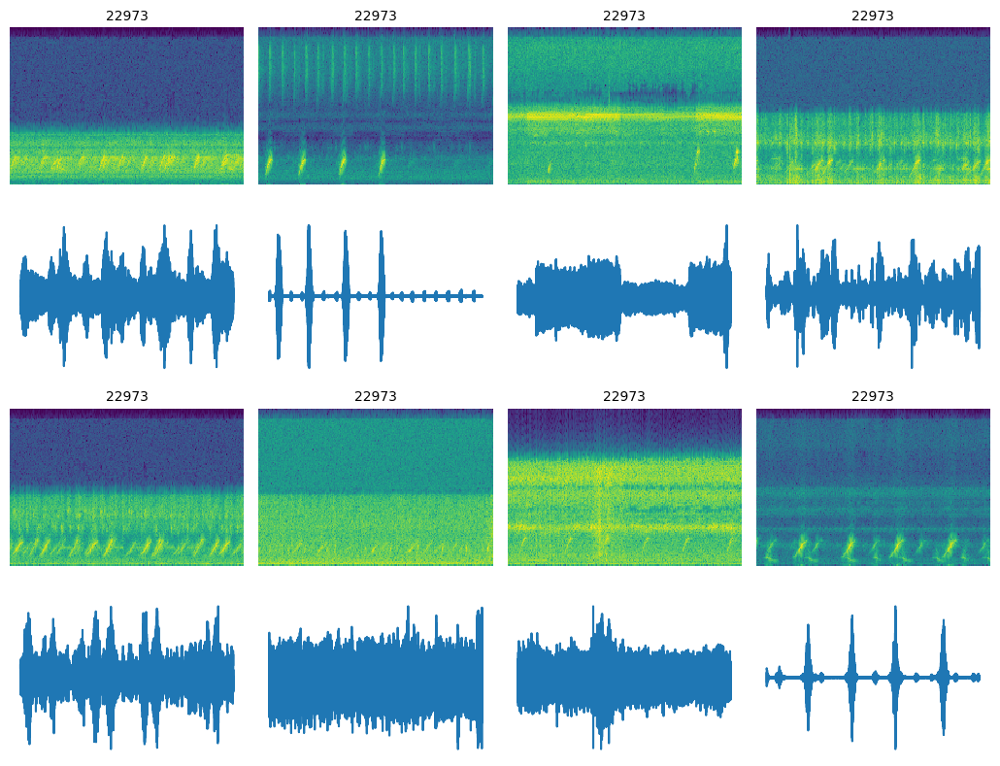

Playing: 22973


Playing: 22973


Playing: 22973


Playing: 22973


Playing: 22973


Playing: 22973


Playing: 22973


Playing: 22973


In [38]:
from src.utils.plots import plot_wave_spectrograms


samples = [dataset[ii] for ii in range(200, 208)]
waveforms = [sample[0] for sample in samples]
targets = [get_label(sample[1]) for sample in samples]

plot_wave_spectrograms(
    waveforms=waveforms,
    sample_rate=dataset.sample_rate,
    class_names=targets,
    num_cols=4
)

In [26]:
testing_dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=6,
    shuffle=True,
    drop_last=True,
    num_workers=8,
    pin_memory=True
)
for batch in testing_dataloader:
    break
    
print(
    "Audio Batch Shape:", batch[0].shape,
    "\nTarget Batch Shape:", batch[1].shape,
)

Audio Batch Shape: torch.Size([6, 160000]) 
Target Batch Shape: torch.Size([6, 206])


NameError: name 'dataset' is not defined

In [34]:
from src.models.spec_cnn import SpecCNNClassifier

testing_model = SpecCNNClassifier(
    backbone="tf_efficientnet_b0.in1k",
    device="cpu",
    n_classes=dataset.target_encoder.categories_[0].shape[0],
    spec_params={
        "sample_rate": 32000,
        "n_mels": 128,
        "f_min": 20,
        "n_fft": 1024,
        "hop_length": 512,
        "normalized": True, 
    },
    top_db=80.0,
    normalize_config={
        "normalize_standart": True,
        "normalize_minmax": True,
    },
    pretrained=True
)

c:\Projects\AUDIO\BirdCLEF2025\.venv\Lib\site-packages\huggingface_hub\file_download.py:144: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\igali\.cache\huggingface\hub\models--timm--tf_efficientnet_b0.in1k. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Unexpected keys (bn2.bias, bn2.num_batches_tracked, bn2.running_mean, bn2.running_var, bn2.weight, clas

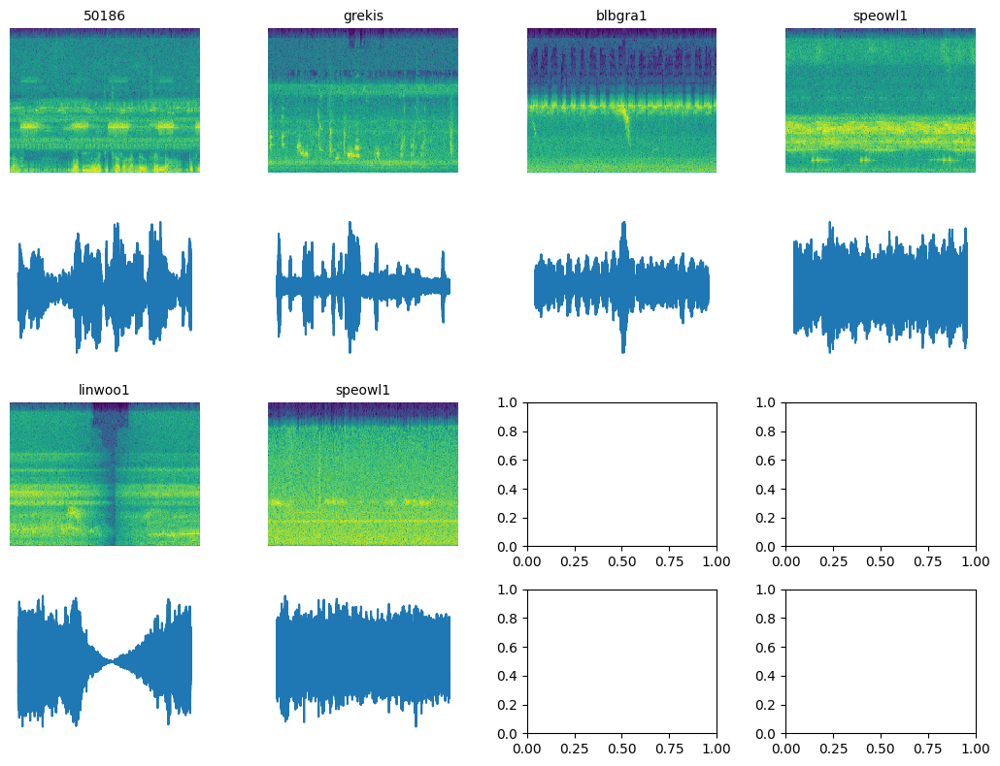

Playing: 50186


Playing: grekis


Playing: blbgra1


Playing: speowl1


Playing: linwoo1


Playing: speowl1


In [39]:
plot_wave_spectrograms(
    batch[0],
    32000,
    [get_label(target) for target in batch[1]],
    num_cols=4
)

In [40]:
nn_specs = testing_model.forward(batch[0], return_spec_feature=True)

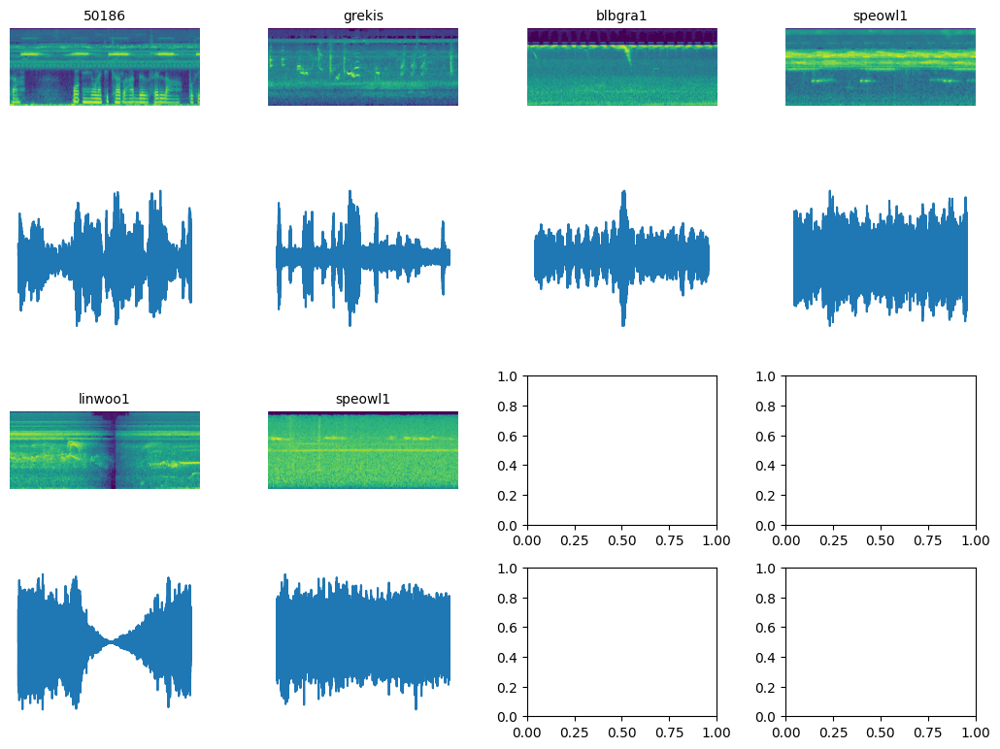

Playing: 50186


Playing: grekis


Playing: blbgra1


Playing: speowl1


Playing: linwoo1


Playing: speowl1


In [41]:
plot_wave_spectrograms(
    batch[0],
    32000,
    [get_label(target) for target in batch[1]],
    num_cols=4,
    specs=[torch.flip(spec, (0,)) for spec in nn_specs]
)

In [42]:
with torch.no_grad():
    cnn_embed = testing_model(
        batch[0],
        return_cnn_emb=True
    ).detach().cpu()

In [43]:
cnn_embed.shape

torch.Size([6, 320, 4, 10])

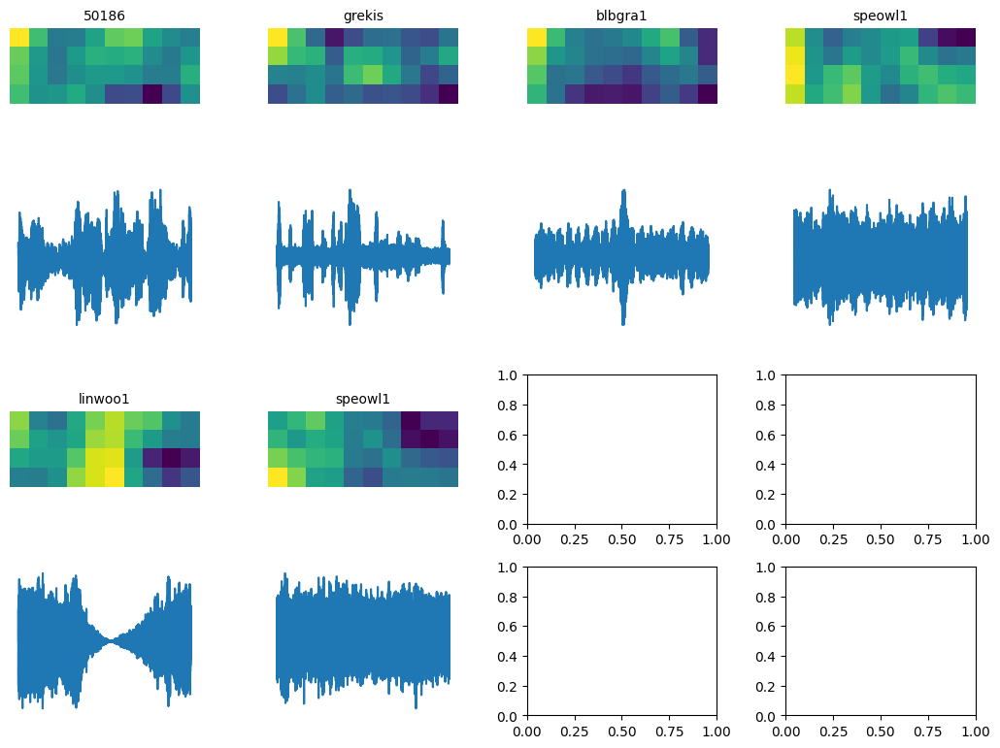

Playing: 50186


Playing: grekis


Playing: blbgra1


Playing: speowl1


Playing: linwoo1


Playing: speowl1


In [44]:
plot_wave_spectrograms(
    batch[0],
    32000,
    [get_label(target) for target in batch[1]],
    num_cols=4,
    specs=[torch.flip(embed[embed.shape[0] // 2], (0,)) for embed in cnn_embed]
)

In [45]:
with torch.no_grad():
    logits = testing_model(
        batch[0]
    )

logits

{'logits': tensor([[ 0.0179, -0.4649, -0.4084,  ...,  0.7140, -0.4766,  1.1805],
         [ 0.0221, -0.2012,  0.3376,  ...,  1.2207, -1.1512, -1.0938],
         [-0.6971, -1.1971, -1.6797,  ..., -0.2417,  1.7301, -0.2808],
         [-0.5262, -0.5523, -0.0955,  ..., -0.5804,  0.9222, -0.5454],
         [ 0.4180,  1.0338,  1.7779,  ..., -0.2107, -0.0489,  2.5148],
         [-0.3096, -1.0955, -0.6123,  ..., -1.5538, -1.4862, -1.2113]])}